In [1]:
import sys
import os

In [2]:
import folium as fl
import pandas as pd
import geopandas as gpd

## Geocoding

In [3]:
from geopy.geocoders import Nominatim

def geocode(city):
    geolocator = Nominatim(user_agent="siglibre")
    location = geolocator.geocode(city)
    latitude = location.latitude
    longitude = location.longitude
    return (latitude, longitude)
    


In [4]:
city = "Girona, Spain"
coords = geocode(city)
coords

(41.9793006, 2.8199439)

In [5]:
fl.Map(location=coords)

In [6]:
m = fl.Map(location=coords)
marker = fl.Marker(location=coords, draggable=False)
marker.add_to(m)
m

## Choropleth

In [7]:
coords = [40.409120, -3.700144]

In [8]:
mapa = gpd.read_file('./datos/es/provincias.geojson')
natalidad = pd.read_csv('./datos/es/natalidad.csv')

<Axes: >

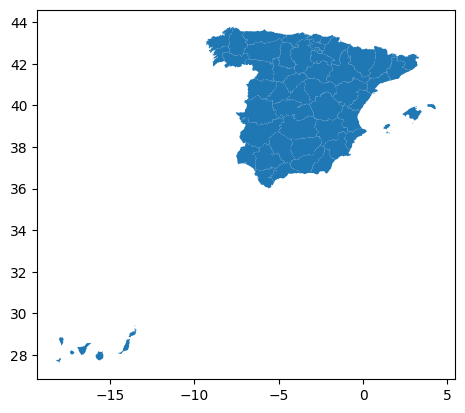

In [9]:
mapa.plot()

In [10]:
m = fl.Map(location=coords, zoom_start=6)

In [11]:
natalidad

,NAME,NATALIDAD
0,Almería,10.48
1,Cádiz,8.11
2,Córdoba,7.90
3,Granada,7.78
4,Huelva,7.57
5,Jaén,7.68
6,Málaga,8.14
7,Sevilla,8.71
8,Huesca,7.51
9,Teruel,7.10


In [12]:
mapa

,NAME_1,NAME_2,CC_2,geometry
0,Andalucía,Almería,04,"MULTIPOLYGON (((-3.03042 35.94236, -3.03042 35..."
1,Andalucía,Cádiz,11,"MULTIPOLYGON (((-6.21958 36.38110, -6.21958 36..."
2,Andalucía,Córdoba,14,"MULTIPOLYGON (((-5.04854 37.63690, -5.04667 37..."
3,Andalucía,Granada,18,"MULTIPOLYGON (((-3.35014 36.72952, -3.35014 36..."
4,Andalucía,Huelva,21,"MULTIPOLYGON (((-6.83648 37.11547, -6.83643 37..."
5,Andalucía,Jaén,23,"MULTIPOLYGON (((-3.00812 37.60799, -3.02137 37..."
6,Andalucía,Málaga,29,"MULTIPOLYGON (((-4.00083 36.73986, -4.00153 36..."
7,Andalucía,Sevilla,41,"MULTIPOLYGON (((-5.94118 36.85199, -5.95270 36..."
8,Aragón,Huesca,22,"MULTIPOLYGON (((0.34747 41.42733, 0.34187 41.4..."
9,Aragón,Teruel,44,"MULTIPOLYGON (((0.02648 40.69497, 0.02688 40.7..."


In [13]:
fl.Choropleth(
    geo_data='./datos/es/provincias.geojson',
    name='choropleth',
    data=natalidad,
    columns=['NAME', 'NATALIDAD'],
    key_on='feature.properties.NAME_2',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Tasa de natalidad (%)'
).add_to(m)
display(m)

## Extra exercise

In [14]:
municipios_file = './datos/cat/divisions-administratives-v2r1-municipis-1000000-20230511.json'
municipios = gpd.read_file(municipios_file)
municipios

,CODIMUNI,NOMMUNI,CAPMUNI,AREAM5000,CODICOMAR,NOMCOMAR,CAPCOMAR,CODIVEGUE,NOMVEGUE,CAPVEGUE,CODIPROV,NOMPROV,CAPPROV,geometry
0,080018,Abrera,Abrera,19.978100,11,Baix Llobregat,Sant Feliu de Llobregat,01,Barcelona,Barcelona,08,Barcelona,Barcelona,"MULTIPOLYGON (((1.92486 41.53663, 1.92197 41.5..."
1,080023,Aguilar de Segarra,Aguilar de Segarra,43.219825,07,Bages,Manresa,07,Catalunya Central,*,08,Barcelona,Barcelona,"MULTIPOLYGON (((1.61829 41.76885, 1.61278 41.7..."
2,080039,Alella,Alella,9.619100,21,Maresme,Mataró,01,Barcelona,Barcelona,08,Barcelona,Barcelona,"MULTIPOLYGON (((2.28512 41.51534, 2.28501 41.5..."
3,080044,Alpens,Alpens,13.778822,43,Lluçanès,Prats de Lluçanès,07,Catalunya Central,*,08,Barcelona,Barcelona,"MULTIPOLYGON (((2.09411 42.14192, 2.09031 42.1..."
4,080057,l'Ametlla del Vallès,l'Ametlla del Vallès,14.088500,41,Vallès Oriental,Granollers,01,Barcelona,Barcelona,08,Barcelona,Barcelona,"MULTIPOLYGON (((2.24126 41.70273, 2.24178 41.7..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
942,439039,Camarles,Camarles,25.194700,09,Baix Ebre,Tortosa,05,Terres de l'Ebre,Tortosa,43,Tarragona,Tarragona,"MULTIPOLYGON (((0.64370 40.82120, 0.64239 40.8..."
943,439044,l'Aldea,l'Aldea,35.273000,09,Baix Ebre,Tortosa,05,Terres de l'Ebre,Tortosa,43,Tarragona,Tarragona,"MULTIPOLYGON (((0.60964 40.80699, 0.60855 40.8..."
944,439057,Salou,Salou,15.124756,36,Tarragonès,Tarragona,04,Camp de Tarragona,Tarragona,43,Tarragona,Tarragona,"MULTIPOLYGON (((1.14208 41.09693, 1.13671 41.0..."
945,439060,l'Ampolla,l'Ampolla,35.638800,09,Baix Ebre,Tortosa,05,Terres de l'Ebre,Tortosa,43,Tarragona,Tarragona,"MULTIPOLYGON (((0.69184 40.85044, 0.69102 40.8..."


In [15]:
import numpy as np

In [16]:
datos = municipios[['CODIMUNI']]
datos['valor'] = np.random.random(len(municipios))

/tmp/ipykernel_1536/4210950247.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos['valor'] = np.random.random(len(municipios))


In [17]:
datos

,CODIMUNI,valor
0,080018,0.567509
1,080023,0.748083
2,080039,0.649116
3,080044,0.212406
4,080057,0.584059
...,...,...
942,439039,0.171921
943,439044,0.935674
944,439057,0.714275
945,439060,0.329516


In [18]:

fl.Choropleth(
    geo_data=municipios,
    name='choropleth',
    data=datos,
    columns=['CODIMUNI', 'valor'],
    key_on='feature.properties.CODIMUNI',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Tasa de natalidad (%)'
).add_to(m)
display(m)

In [19]:
municipios = pd.read_csv('data/municipios.csv')
municipios.Longitud = capitales.Longitud.str.replace(',','.').astype('float')
municipios.Latitud = capitales.Latitud.str.replace(',','.').astype('float')
capitales = municipios.get(municipios.Capital=='Si')

FileNotFoundError: [Errno 2] No such file or directory: 'data/municipios.csv'

In [ ]:
municipios.sort_values('AREAM5000', ascending=False).head(10)

In [ ]:
selected = municipios.sort_values('AREAM5000', ascending=False).head(10)

In [ ]:
m = fl.Map(location=[40.409120, -3.700144], zoom_start=6)
for _,row in selected.iterrows():
    fl.Marker([row.geometry.centroid.y, row.geometry.centroid.x], popup=row['AREAM5000']).add_to(m)
    
for _, row in selected.iterrows():
    # Without simplifying the representation of each borough,
    # the map might not be displayed
    sim_geo = gpd.GeoSeries(row["geometry"]).simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = fl.GeoJson(data=geo_j, style_function=lambda x: {"fillColor": "orange"})
    geo_j.add_to(m)
display(m)

https://stacindex.org/catalogs/catalonia-monthly-sentinel2#/?t=1

In [ ]:
import rasterio as rio


img_file = "../img/ortoimatge-sentinel2-mensual-v1r0-rgb8b-202305.tif"


In [ ]:
with rio.open(img_file) as src:
    img = src.read()
    src_crs = src.crs['init'].upper()
    min_lon, min_lat, max_lon, max_lat = src.bounds

In [ ]:
src_crs

In [ ]:
dst_crs = 'EPSG:4326'

In [ ]:
src.bounds

In [ ]:
from rasterio.enums import Resampling

upscale_factor = 1/4

with rio.open(img_file) as dataset:

    # resample data to target shape
    img = dataset.read(
        out_shape=(
            dataset.count,
            int(dataset.height * upscale_factor),
            int(dataset.width * upscale_factor)
        ),
        resampling=Resampling.bilinear
    )

    # scale image transform
    transform = dataset.transform * dataset.transform.scale(
        (dataset.width / data.shape[-1]),
        (dataset.height / data.shape[-2])
    )

    src_crs = dataset.crs['init'].upper()
    min_lon, min_lat, max_lon, max_lat = dataset.bounds

In [ ]:
img.shape

In [ ]:
transform

In [ ]:
from rasterio.plot import show


In [ ]:
## Conversion from UTM to WGS84 CRS

from pyproj import Transformer 

bounds_orig = [[min_lat, min_lon], [max_lat, max_lon]]

bounds_fin = []
 
for item in bounds_orig:   
    #converting to lat/lon
    lat = item[0]
    lon = item[1]
    
    proj = Transformer.from_crs(int(src_crs.split(":")[1]), int(dst_crs.split(":")[1]), always_xy=True)

    lon_n, lat_n = proj.transform(lon, lat)
    
    bounds_fin.append([lat_n, lon_n])

# Finding the centre latitude & longitude    
centre_lon = bounds_fin[0][1] + (bounds_fin[1][1] - bounds_fin[0][1])/2
centre_lat = bounds_fin[0][0] + (bounds_fin[1][0] - bounds_fin[0][0])/2

In [ ]:
bounds_fin

In [ ]:
import numpy as np

In [ ]:
m = fl.Map(location=[centre_lat, centre_lon], zoom_start = 6)

# img.transpose(1, 2, 0)
# np.moveaxis(img, 0, -1)

# Overlay raster using add_child() function
m.add_child(fl.raster_layers.ImageOverlay(np.moveaxis(img, 0, -1), 
                                          opacity=1, 
                                          bounds = bounds_fin)
           )

# Display map 
m

In [ ]:
m = fl.Map(location=[40.409120, -3.700144], zoom_start=6)

image = fl.raster_layers.ImageOverlay(
        name="Sentinel",
        image = img, 
        bounds=[[25, -180], [80, 180]],
        interactive=True,
        zindex=1,
    )

image.add_to(m) 